<a href="https://colab.research.google.com/github/avinair108/Deep-Learning-Projects/blob/main/Exploring_GAN_Varied_Techniques.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import struct
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
import joblib
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
import random
import gzip
import shutil
import os
import matplotlib.pyplot as plt
import math
import itertools
import imageio
import natsort
from glob import glob
import torchvision.transforms as transforms
from PIL import Image
import torchvision.utils as vutils
import matplotlib.animation as animation
from IPython.display import HTML
import torchvision

In [ ]:
!wget -nc http://fashion-mnist.s3-website.eu-central-1.amazonaws.com/train-images-idx3-ubyte.gz
!wget -nc http://fashion-mnist.s3-website.eu-central-1.amazonaws.com/train-labels-idx1-ubyte.gz
!wget -nc http://fashion-mnist.s3-website.eu-central-1.amazonaws.com/t10k-images-idx3-ubyte.gz
!wget -nc http://fashion-mnist.s3-website.eu-central-1.amazonaws.com/t10k-labels-idx1-ubyte.gz

# Unzip the downloaded files
!gunzip -k train-images-idx3-ubyte.gz
!gunzip -k train-labels-idx1-ubyte.gz
!gunzip -k t10k-images-idx3-ubyte.gz
!gunzip -k t10k-labels-idx1-ubyte.gz

--2024-10-15 04:36:20--  http://fashion-mnist.s3-website.eu-central-1.amazonaws.com/train-images-idx3-ubyte.gz
Resolving fashion-mnist.s3-website.eu-central-1.amazonaws.com (fashion-mnist.s3-website.eu-central-1.amazonaws.com)... 52.219.169.84, 52.219.170.188, 52.219.75.206, ...
Connecting to fashion-mnist.s3-website.eu-central-1.amazonaws.com (fashion-mnist.s3-website.eu-central-1.amazonaws.com)|52.219.169.84|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 26421880 (25M) [binary/octet-stream]
Saving to: ‘train-images-idx3-ubyte.gz’

train-images-idx3-u 100%[===================>]  25.20M  9.05MB/s    in 2.8s    

2024-10-15 04:36:23 (9.05 MB/s) - ‘train-images-idx3-ubyte.gz’ saved [26421880/26421880]

--2024-10-15 04:36:23--  http://fashion-mnist.s3-website.eu-central-1.amazonaws.com/train-labels-idx1-ubyte.gz
Resolving fashion-mnist.s3-website.eu-central-1.amazonaws.com (fashion-mnist.s3-website.eu-central-1.amazonaws.com)... 52.219.169.84, 52.219.170.188, 52.

In [ ]:
def read_idx(file_path):
    with open(file_path, 'rb') as f:
        magic_number, size = struct.unpack('>II', f.read(8))
        if magic_number == 2051:  # 2051 code for images
            rows, cols = struct.unpack('>II', f.read(8))
            data = np.fromfile(f, dtype=np.uint8).reshape(size, rows, cols)
        elif magic_number == 2049:  # 2049 code for labels
            data = np.fromfile(f, dtype=np.uint8)
        else:
            raise ValueError('Invalid IDX file')
    return data

# Load images and labels
train_images = read_idx('train-images-idx3-ubyte')
train_labels = read_idx('train-labels-idx1-ubyte')

test_images = read_idx('t10k-images-idx3-ubyte')
test_labels = read_idx('t10k-labels-idx1-ubyte')

train_images = train_images.astype(np.float32) / 255.0
test_images = test_images.astype(np.float32) / 255.0

In [ ]:
class FashionMNISTDataset(Dataset):
    def __init__(self, images, labels, transform=None):
        self.images = images
        self.labels = labels
        self.transform = transform

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        image = self.images[idx]
        label = self.labels[idx]
        if self.transform:
            image = self.transform(image)
        return image, label

In [ ]:
transform = transforms.Compose([
    transforms.ToPILImage(),   # Convert tensor to PIL image
    transforms.Resize((64, 64)), # Resize to 64x64
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,)),# Convert PIL image back to tensor
])

combined_images = np.concatenate((train_images, test_images), axis=0)
combined_labels = np.concatenate((train_labels, test_labels), axis=0)

# Normalize the combined images
#combined_images = combined_images.astype(np.float32) / 255.0

# Define the combined dataset
combined_dataset = FashionMNISTDataset(combined_images, combined_labels, transform=transform)

# Define DataLoader
train_loader = DataLoader(dataset=combined_dataset, batch_size=128, shuffle=True, num_workers=2)


In [ ]:
# Batch size during training
batch_size = 128

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 64

# Number of channels in the training images. For color images this is 3
nc = 1

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 5

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparameter for Adam optimizers
beta1 = 0.5

ngpu = 1

In [ ]:
# custom weights initialization called on ``netG`` and ``netD``
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [ ]:
import torch.nn as nn

class Generator_WGAN(nn.Module):
    def __init__(self, nz, ngf, nc):
        super(Generator_WGAN, self).__init__()
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d(nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d(ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d(ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)

In [ ]:
device = torch.device("cuda:0" if (torch.cuda.is_available() ) else "cpu")

WGAN_G = Generator_WGAN(nz, ngf, nc).to(device)

WGAN_G.apply(weights_init)

Generator_WGAN(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 1, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
 

In [ ]:
class Critic(nn.Module):
    def __init__(self, ndf, nc):
        super(Critic, self).__init__()
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            # Output a single scalar value
        )

    def forward(self, input):
        return self.main(input).view(-1)


In [ ]:

# Create the critic
critic = Critic(ndf, nc).to(device)
critic.apply(weights_init)

Critic(
  (main): Sequential(
    (0): Conv2d(1, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
  )
)

In [ ]:
# Training Loop for WGAN

# Lists to keep track of progress
img_list = []
G_WGAN_losses = []
C_WGAN_losses = []  # Critic losses (formerly D_losses)
iters = 0

num_epochs = 5
n_critic = 5  # Number of critic updates per generator update
weight_clip_value = 0.05  # Clip weights between -0.01 and 0.01

fixed_noise = torch.randn(64, nz, 1, 1, device=device)

lr = 0.0002

optimizerC = torch.optim.RMSprop(critic.parameters(), lr=lr)
optimizerG = torch.optim.RMSprop(WGAN_G.parameters(), lr=lr)



print("Starting Training Loop...")
for epoch in range(num_epochs):
    for i, data in enumerate(train_loader, 0):

        ############################
        # (1) Update Critic Network: maximize E[Critic(real)] - E[Critic(fake)]
        ###########################
        for _ in range(n_critic):  # Update the critic multiple times
            # Train with real batch
            critic.zero_grad()
            real_data = data[0].to(device)
            batch_size = real_data.size(0)

            # Forward pass real batch through Critic
            real_output = critic(real_data).view(-1)
            critic_real_loss = -torch.mean(real_output)

            # Generate batch of latent vectors
            noise = torch.randn(batch_size, nz, 1, 1, device=device)

            # Generate fake images with Generator
            fake_data = WGAN_G(noise)

            # Forward pass fake batch through Critic
            fake_output = critic(fake_data.detach()).view(-1)
            critic_fake_loss = torch.mean(fake_output)

            # Calculate total Critic loss
            critic_loss = critic_real_loss + critic_fake_loss
            critic_loss.backward()
            optimizerC.step()

            # Clip Critic weights
            for p in critic.parameters():
                p.data.clamp_(-weight_clip_value, weight_clip_value)

        ############################
        # (2) Update Generator Network: maximize E[Critic(fake)]
        ###########################
        WGAN_G.zero_grad()

        # Generate fake images with Generator
        noise = torch.randn(batch_size, nz, 1, 1, device=device)
        fake_data = WGAN_G(noise)

        # Forward pass fake batch through Critic
        fake_output = critic(fake_data).view(-1)
        generator_loss = -torch.mean(fake_output)

        # Calculate gradients for Generator
        generator_loss.backward()
        optimizerG.step()

        # Save losses for plotting later
        G_WGAN_losses.append(generator_loss.item())
        C_WGAN_losses.append(critic_loss.item())

        # Output training stats every 50 iterations
        if i % 50 == 0:
            print(f'[{epoch}/{num_epochs}][{i}/{len(train_loader)}]\t'
                  f'Loss_Critic: {critic_loss.item():.4f}\t'
                  f'Loss_Generator: {generator_loss.item():.4f}')

        # Save images to visualize progress
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(train_loader)-1)):
            with torch.no_grad():
                fake = WGAN_G(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

# Plot Generator and Critic losses after training
import matplotlib.pyplot as plt

plt.figure(figsize=(10,5))
plt.title("Generator and Critic Loss During Training")
plt.plot(G_WGAN_losses, label="G")
plt.plot(C_WGAN_losses, label="Critic")
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

Starting Training Loop...
[0/5][0/547]	Loss_Critic: -4.8090	Loss_Generator: 2.8571
[0/5][50/547]	Loss_Critic: -31.0776	Loss_Generator: 16.5015
[0/5][100/547]	Loss_Critic: -38.1189	Loss_Generator: 19.3293
[0/5][150/547]	Loss_Critic: -38.3446	Loss_Generator: 19.3702
[0/5][200/547]	Loss_Critic: -37.7704	Loss_Generator: 19.2160
[0/5][250/547]	Loss_Critic: -38.1115	Loss_Generator: 19.2289
[0/5][300/547]	Loss_Critic: -37.3673	Loss_Generator: 19.1123
[0/5][350/547]	Loss_Critic: -38.8782	Loss_Generator: 19.5669
[0/5][400/547]	Loss_Critic: -38.7805	Loss_Generator: 19.5373
[0/5][450/547]	Loss_Critic: -38.1895	Loss_Generator: 19.3353
[0/5][500/547]	Loss_Critic: -38.2684	Loss_Generator: 19.3026
[1/5][0/547]	Loss_Critic: -38.7117	Loss_Generator: 19.5806
[1/5][50/547]	Loss_Critic: -39.0895	Loss_Generator: 19.7440
[1/5][100/547]	Loss_Critic: -39.0435	Loss_Generator: 19.6521
[1/5][150/547]	Loss_Critic: -38.4393	Loss_Generator: 19.3896
[1/5][200/547]	Loss_Critic: -39.0023	Loss_Generator: 19.6533
[1/5][

KeyboardInterrupt: 

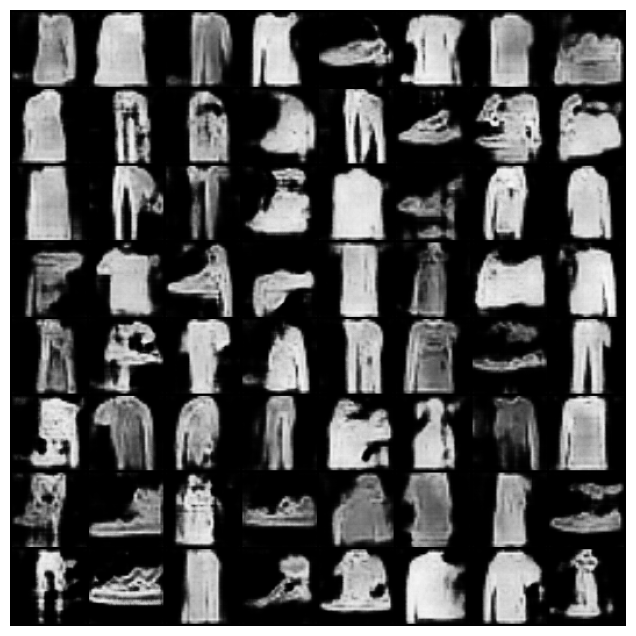

In [ ]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

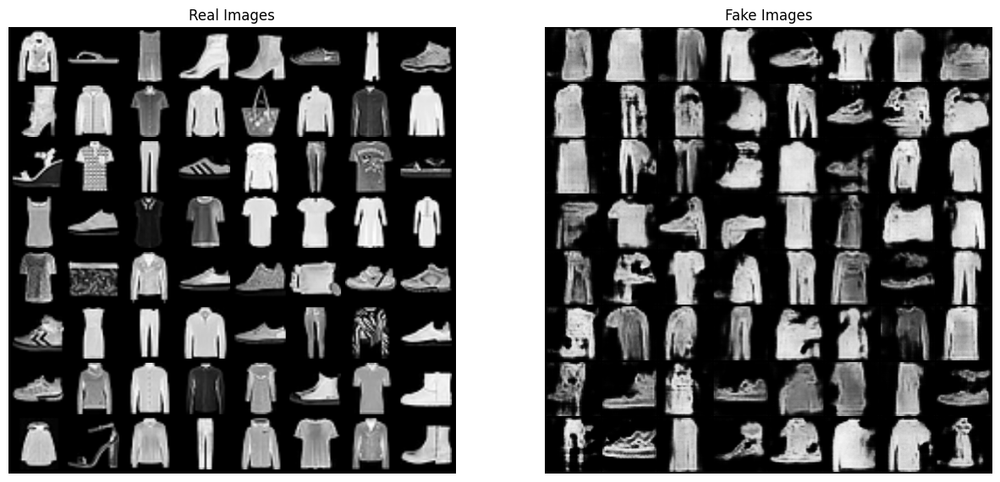

In [ ]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(train_loader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

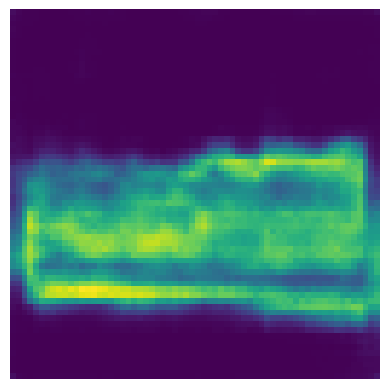

In [ ]:
### Run to generate an image with DCGAN Architecture 1

WGAN_G.eval()

# Step 2: Generate a random noise vector
# Use the same 'nz' that was used during training (latent vector size)
new_noise = torch.randn(1, nz, 1, 1, device=device)

# Step 3: Generate the image using the generator
with torch.no_grad():  # No need to compute gradients for generating images
    generated_image = WGAN_G(new_noise).cpu()

# Step 4: Convert and visualize the generated image
# Assuming the output is in range [-1, 1], we'll denormalize it back to [0, 1] for visualization

import matplotlib.pyplot as plt
import numpy as np

# Function to denormalize and show the generated image
def show_generated_image(img):
    img = (img + 1) / 2  # Denormalize from [-1, 1] to [0, 1]
    np_img = img.numpy()
    plt.imshow(np.transpose(np_img, (1, 2, 0)))
    plt.axis('off')
    plt.show()

# Display the generated image directly without using make_grid
show_generated_image(generated_image[0])  # Access the first image in the batch

WGAN-GP

In [ ]:
from torch.autograd import grad

def gradient_penalty(critic, real_data, fake_data, device, lambda_gp=10):
    # Interpolate real and fake data
    alpha = torch.rand(real_data.size(0), 1, 1, 1, device=device)
    interpolates = (alpha * real_data + (1 - alpha) * fake_data).requires_grad_(True)

    # Pass interpolates through critic
    interpolates_output = critic(interpolates)

    # Compute gradients with respect to interpolates
    gradients = grad(
        outputs=interpolates_output,
        inputs=interpolates,
        grad_outputs=torch.ones_like(interpolates_output, device=device),
        create_graph=True,
        retain_graph=True,
    )[0]

    # Compute gradient norm and penalty
    gradients = gradients.view(gradients.size(0), -1)
    gradient_norm = gradients.norm(2, dim=1)
    gradient_penalty = ((gradient_norm - 1) ** 2).mean()

    return lambda_gp * gradient_penalty



Starting WGAN-GP Training Loop...
[0/5][0/547]	Loss_Critic_GP: -4.4747	Loss_Generator_GP: 2.5985
[0/5][50/547]	Loss_Critic_GP: -54.1135	Loss_Generator_GP: 9.0358
[0/5][100/547]	Loss_Critic_GP: -56.8268	Loss_Generator_GP: 31.7448
[0/5][150/547]	Loss_Critic_GP: -41.3493	Loss_Generator_GP: 25.9651
[0/5][200/547]	Loss_Critic_GP: -114.5338	Loss_Generator_GP: 42.1943
[0/5][250/547]	Loss_Critic_GP: -49.9385	Loss_Generator_GP: 45.3077
[0/5][300/547]	Loss_Critic_GP: -23.4281	Loss_Generator_GP: 46.6848
[0/5][350/547]	Loss_Critic_GP: -62.8653	Loss_Generator_GP: 68.4316
[0/5][400/547]	Loss_Critic_GP: -5.7312	Loss_Generator_GP: 50.1809
[0/5][450/547]	Loss_Critic_GP: -10.3390	Loss_Generator_GP: 55.6408
[0/5][500/547]	Loss_Critic_GP: -16.7079	Loss_Generator_GP: 66.9113
[1/5][0/547]	Loss_Critic_GP: -9.7944	Loss_Generator_GP: 66.4957
[1/5][50/547]	Loss_Critic_GP: -6.5953	Loss_Generator_GP: 72.9806
[1/5][100/547]	Loss_Critic_GP: -6.1914	Loss_Generator_GP: 61.7483
[1/5][150/547]	Loss_Critic_GP: -33.0731	

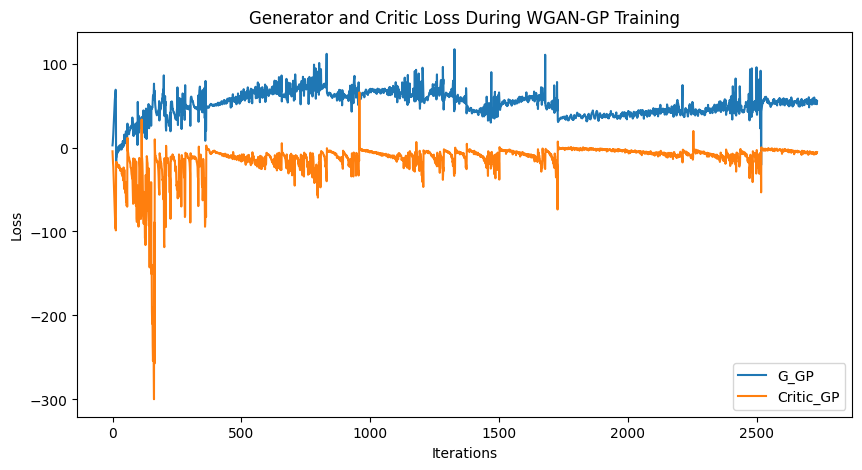

In [ ]:

device = torch.device("cuda:0" if (torch.cuda.is_available() ) else "cpu")

WGAN_G_GP = Generator_WGAN(nz, ngf, nc).to(device)
WGAN_G_GP.apply(weights_init)

critic_GP = Critic(ndf, nc).to(device)
critic_GP.apply(weights_init)

# Optimizers for WGAN-GP
optimizerC_GP = optim.Adam(critic_GP.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG_GP = optim.Adam(WGAN_G_GP.parameters(), lr=lr, betas=(beta1, 0.999))

G_WGAN_GP_losses = []
C_WGAN_GP_losses = []
img_list = []
n_critic = 5  # Number of critic updates per generator update
lambda_gp = 10
iters = 0

# Create fixed noise for consistent image visualization
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

print("Starting WGAN-GP Training Loop...")
for epoch in range(num_epochs):
    for i, data in enumerate(train_loader, 0):
        ############################
        # (1) Update Critic Network: maximize E[Critic(real)] - E[Critic(fake)] + λGP * GP
        ###########################
        for _ in range(n_critic):
            critic_GP.zero_grad()
            real_data = data[0].to(device)
            batch_size = real_data.size(0)

            # Generate fake data
            noise = torch.randn(batch_size, nz, 1, 1, device=device)
            fake_data = WGAN_G_GP(noise)

            # Compute Critic loss
            real_output = critic_GP(real_data).view(-1)
            fake_output = critic_GP(fake_data.detach()).view(-1)
            critic_real_loss = -torch.mean(real_output)
            critic_fake_loss = torch.mean(fake_output)

            # Calculate gradient penalty
            gp = gradient_penalty(critic_GP, real_data, fake_data, device, lambda_gp)

            # Total Critic loss
            critic_loss = critic_real_loss + critic_fake_loss + gp
            critic_loss.backward()
            optimizerC_GP.step()

        ############################
        # (2) Update Generator Network: maximize E[Critic(fake)]
        ###########################
        WGAN_G_GP.zero_grad()
        noise = torch.randn(batch_size, nz, 1, 1, device=device)
        fake_data = WGAN_G_GP(noise)
        fake_output = critic_GP(fake_data).view(-1)
        generator_loss = -torch.mean(fake_output)

        generator_loss.backward()
        optimizerG_GP.step()

        # Save losses for plotting later
        G_WGAN_GP_losses.append(generator_loss.item())
        C_WGAN_GP_losses.append(critic_loss.item())

        # Output training stats every 50 iterations
        if i % 50 == 0:
            print(f'[{epoch}/{num_epochs}][{i}/{len(train_loader)}]\t'
                  f'Loss_Critic_GP: {critic_loss.item():.4f}\t'
                  f'Loss_Generator_GP: {generator_loss.item():.4f}')

        # Save images to visualize progress
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(train_loader)-1)):
            with torch.no_grad():
                fake = WGAN_G_GP(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

# Save the losses
torch.save({
    'G_WGAN_GP_losses': G_WGAN_GP_losses,
    'C_WGAN_GP_losses': C_WGAN_GP_losses
}, 'WGAN_GP_losses.pth')

# Plot Generator and Critic losses after training
import matplotlib.pyplot as plt

plt.figure(figsize=(10,5))
plt.title("Generator and Critic Loss During WGAN-GP Training")
plt.plot(G_WGAN_GP_losses, label="G_GP")
plt.plot(C_WGAN_GP_losses, label="Critic_GP")
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()


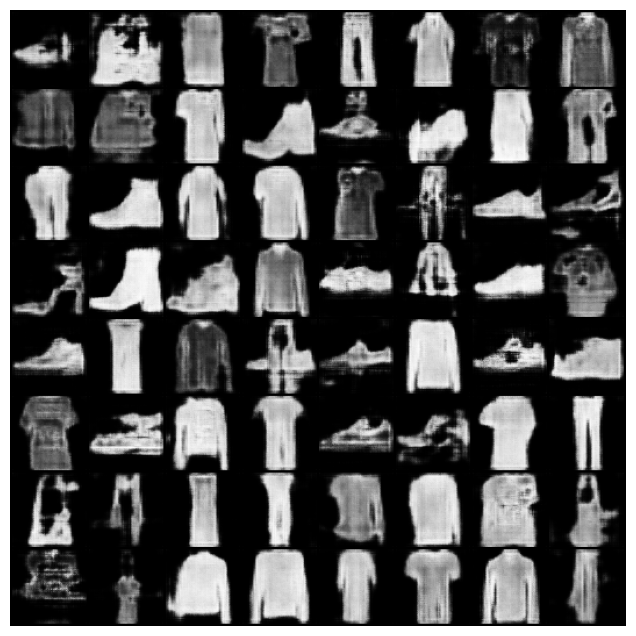

In [ ]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())